In [4]:
!pip install pandasql
!pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


<p style="font-size: 30px;">Imports</p>


In [141]:
# 1. Import Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import geopandas as gpd
from geopy.distance import geodesic
from collections import Counter
import string
from wordcloud import WordCloud
import re
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score, RandomizedSearchCV
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report, roc_auc_score, roc_curve, confusion_matrix
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, RobustScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, r2_score
import warnings
import statsmodels.api as sm
from sklearn.pipeline import Pipeline


sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)


<p style="font-size: 30px;">Load Dataset</p>


In [6]:
# 2. Load Both Datasets and Combine
df1 = pd.read_csv('data/Bnyairbnb.csv')
df2 = pd.read_csv('data/nyairbnb.csv')
print("Shape of Bnyairbnb.csv:", df1.shape)
print("Shape of nyairbnb.csv:", df2.shape)

df = pd.concat([df1, df2], ignore_index=True)
print("Combined dataset shape:", df.shape)
display(df.head())

Shape of Bnyairbnb.csv: (38792, 19)
Shape of nyairbnb.csv: (37541, 19)
Combined dataset shape: (76333, 19)


,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,number_of_reviews,number_of_reviews_ltm,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,Brooklyn,40.68457,-73.91181,1,1,NaN,1.0,"[""Body soap"", ""Dryer"", ""Refrigerator"", ""Wifi"",...",$65.00,30,5,0,4.80,4.6,5.00,5.00,5.00,4.80,5.00
1,Manhattan,40.76878,-73.98719,2,1,1.0,1.0,"[""Smoke alarm"", ""Kitchen"", ""Air conditioning"",...",$110.00,30,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Queens,40.74343,-73.91865,1,1,NaN,1.0,"[""Smoke alarm"", ""Kitchen"", ""Washer"", ""TV"", ""Ai...",$99.00,30,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Brooklyn,40.68180,-73.93121,2,1,1.0,1.0,"[""Smoke alarm"", ""Kitchen"", ""Shampoo"", ""Long te...",$70.00,45,2,0,5.00,5.0,5.00,5.00,5.00,5.00,5.00
4,Brooklyn,40.68209,-73.94279,4,1,1.0,2.0,"[""Clothing storage: closet and dresser"", ""Micr...",$170.00,30,88,14,4.98,5.0,4.99,4.95,4.91,4.94,4.92


In [7]:
df.shape

(76333, 19)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76333 entries, 0 to 76332
Data columns (total 19 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   neighbourhood_group_cleansed  76333 non-null  object 
 1   latitude                      76333 non-null  float64
 2   longitude                     76333 non-null  float64
 3   accommodates                  76333 non-null  int64  
 4   bathrooms                     61582 non-null  object 
 5   bedrooms                      53592 non-null  float64
 6   beds                          60784 non-null  float64
 7   amenities                     76333 non-null  object 
 8   price                         61582 non-null  object 
 9   minimum_nights                76333 non-null  int64  
 10  number_of_reviews             76333 non-null  int64  
 11  number_of_reviews_ltm         76333 non-null  int64  
 12  review_scores_rating          54446 non-null  float64
 13  r

In [9]:
df.isnull().sum().sort_values(ascending = False)

bedrooms                        22741
review_scores_location          22327
review_scores_value             22325
review_scores_checkin           22321
review_scores_accuracy          22313
review_scores_communication     22304
review_scores_cleanliness       22293
review_scores_rating            21887
beds                            15549
bathrooms                       14751
price                           14751
neighbourhood_group_cleansed        0
number_of_reviews_ltm               0
number_of_reviews                   0
latitude                            0
amenities                           0
accommodates                        0
longitude                           0
minimum_nights                      0
dtype: int64

<p style="font-size: 30px;">Data Cleaning</p>


In [10]:
# 3. Data Cleaning
# Force numemrical conversion of bedrooms, bathroom, and beds in order to use as a numerical predictor
bed_cols = ['bedrooms', 'bathrooms', 'beds']
for col in bed_cols:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')
        median_value = df[col].median()
        df[col] = df[col].fillna(median_value)
print(df['bedrooms'])

0        1.0
1        1.0
2        1.0
3        1.0
4        1.0
        ... 
76328    1.0
76329    3.0
76330    1.0
76331    1.0
76332    1.0
Name: bedrooms, Length: 76333, dtype: float64


In [11]:
df.columns

Index(['neighbourhood_group_cleansed', 'latitude', 'longitude', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights',
       'number_of_reviews', 'number_of_reviews_ltm', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value'],
      dtype='object')

In [12]:
# 3. Data Cleaning

# 3a. Remove duplicate rows
df = df.drop_duplicates()
print("After removing duplicates:", df.shape)

# 3b. Convert 'price' column to numeric, outcome variable
df['price'] = df['price'].replace({'\$': '', ',': ''}, regex=True)
df['price'] = pd.to_numeric(df['price'], errors='coerce')
print("Null count in 'price' after conversion:", df['price'].isnull().sum())

# 3c. Drop rows with missing or non-positive prices
df = df.dropna(subset=['price'])
df = df[df['price'] > 0]
print("After dropping missing/zero/negative prices:", df.shape)

# 3d. Select a subset of relevant columns for predictions
cols = [
    'neighbourhood_group_cleansed', 'latitude', 'longitude', 'accommodates',
    'bathrooms', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights',
    'number_of_reviews', 'number_of_reviews_ltm', 'review_scores_rating',
    'review_scores_accuracy', 'review_scores_cleanliness',
    'review_scores_checkin', 'review_scores_communication',
    'review_scores_location', 'review_scores_value'
]
cols = [col for col in cols if col in df.columns]
df = df[cols]
print("Final columns after adjustment:", df.columns.tolist())

# 3e. Handle missing values for numerical review scores using the mean of neighborhoods
# because univariate approach does not take into account
# the location of the Airbnb (Covariate Approach Imputation)
review_score_cols = [
    'review_scores_location', 'review_scores_value', 'review_scores_checkin',
    'review_scores_accuracy', 'review_scores_communication',
    'review_scores_cleanliness', 'review_scores_rating'
]

for col in review_score_cols:
    if col in df.columns:
        df[col] = df.groupby('neighbourhood_group_cleansed')[col].transform(
            lambda x: x.fillna(x.mean())
        )

# 3f. Handle missing values for bedroom, bathroom, and beds using the median based on accomodation
# as higher accomodations typically indicate more bedrooms
# bathrooms and beds (Covariate Approach Imputation)
bed_cols = ['bedrooms', 'bathrooms', 'beds']

for col in bed_cols:
    if col in df.columns:
        df[col] = df.groupby('accommodates')[col].transform(
            lambda x: x.fillna(x.median())
        )
# 3g. Handle any remaining missing values using the mode or "Unknown" for categorical
for col in df.columns:
    if df[col].dtype == 'object':  # For categorical/text columns
        mode_value = df[col].mode()[0] if not df[col].mode().empty else "Unknown"
        df[col] = df[col].fillna(mode_value)
    else:
        mean_value = df[col].mean()
        df[col] = df[col].fillna(mean_value)

# 3h. Final check for missing values
print("Missing values after complete handling:")
df.isnull().sum()


After removing duplicates: (75986, 19)
Null count in 'price' after conversion: 14652
After dropping missing/zero/negative prices: (61333, 19)
Final columns after adjustment: ['neighbourhood_group_cleansed', 'latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'number_of_reviews', 'number_of_reviews_ltm', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']
Missing values after complete handling:


neighbourhood_group_cleansed    0
latitude                        0
longitude                       0
accommodates                    0
bathrooms                       0
bedrooms                        0
beds                            0
amenities                       0
price                           0
minimum_nights                  0
number_of_reviews               0
number_of_reviews_ltm           0
review_scores_rating            0
review_scores_accuracy          0
review_scores_cleanliness       0
review_scores_checkin           0
review_scores_communication     0
review_scores_location          0
review_scores_value             0
dtype: int64

<p style="font-size: 30px;">Log Transformation of Target</p>


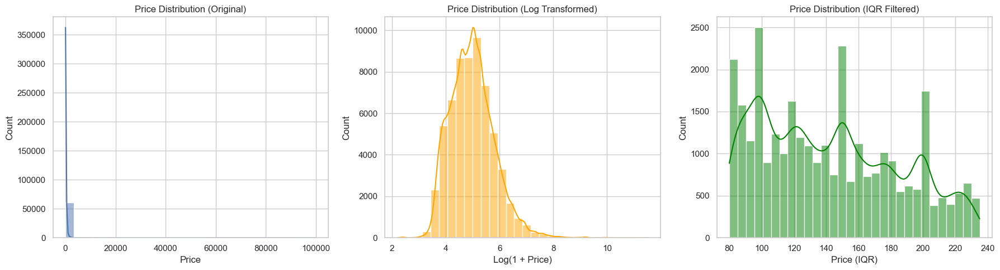

In [ ]:
# 4. Log Transformation / IQR to remove outliers
df['log_price'] = np.log1p(df['price'])
# Remove all values outside of the IQR as outliers in order to reduce skewedness in dataset
Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)
df_iqr = df[(df['price'] >= Q1) & (df['price'] <= Q3)]

fig, ax = plt.subplots(1, 3, figsize=(18, 5))

sns.histplot(df['price'], bins=30, kde=True, ax=ax[0])
ax[0].set_title("Price Distribution (Original)")
ax[0].set_xlabel("Price")


# Because IQR approach does not normalize the distribution, log transformation allows
# for more predictive power in our models


sns.histplot(df['log_price'], bins=30, kde=True, ax=ax[1], color="orange")
ax[1].set_title("Price Distribution (Log Transformed)")
ax[1].set_xlabel("Log(1 + Price)")

sns.histplot(df_iqr['price'], bins=30, kde=True, ax=ax[2], color="green")
ax[2].set_title("Price Distribution (IQR Filtered)")
ax[2].set_xlabel("Price (IQR)")

plt.tight_layout()
plt.show()


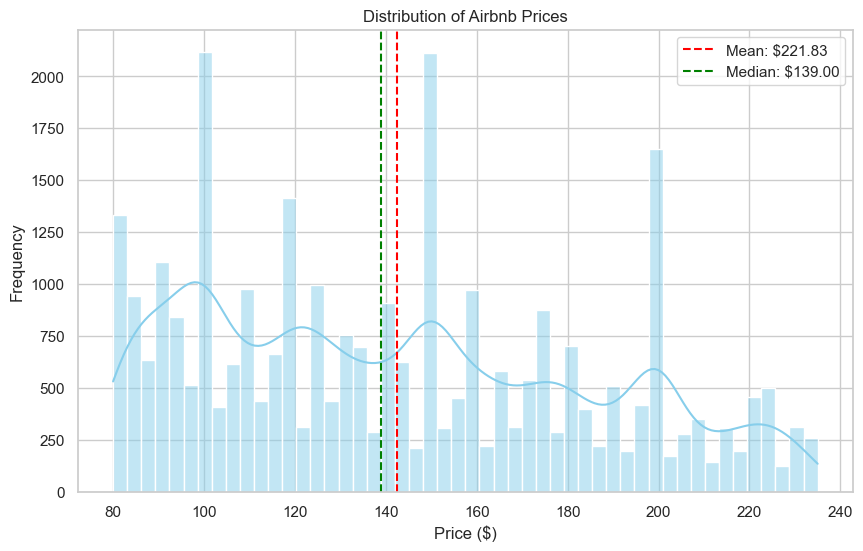

/var/folders/r7/lxsjn34n3ps34t_1wj1z84680000gn/T/ipykernel_2087/1568913846.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=neighborhood_counts.index, y=neighborhood_counts.values, palette="Blues_d")


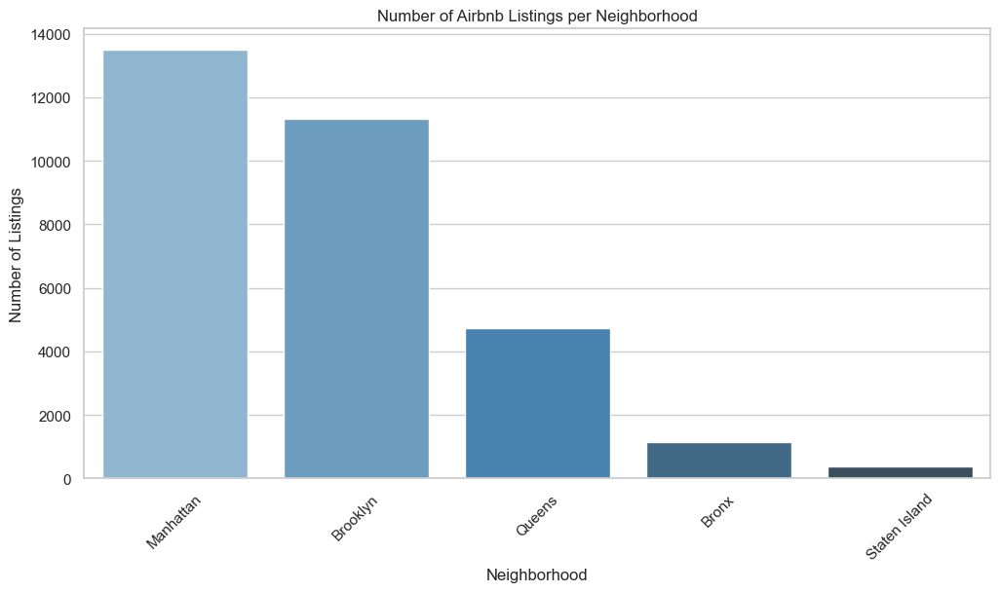

In [14]:
plt.figure(figsize=(10, 6))
sns.histplot(df_iqr['price'], bins=50, kde=True, color='skyblue')
plt.axvline(df_iqr['price'].mean(), color='red', linestyle='--', label=f'Mean: ${df["price"].mean():.2f}')
plt.axvline(df_iqr['price'].median(), color='green', linestyle='--', label=f'Median: ${df["price"].median():.2f}')
plt.title('Distribution of Airbnb Prices')
plt.xlabel('Price ($)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

neighborhood_counts = df_iqr['neighbourhood_group_cleansed'].value_counts().sort_values(ascending=False)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=neighborhood_counts.index, y=neighborhood_counts.values, palette="Blues_d")
plt.title("Number of Airbnb Listings per Neighborhood")
plt.xlabel("Neighborhood")
plt.ylabel("Number of Listings")
plt.xticks(rotation=45)
plt.show()

In [15]:
df.describe()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,number_of_reviews,number_of_reviews_ltm,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,log_price
count,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000
mean,40.728660,-73.944991,2.884467,1.181159,1.340534,1.636835,221.830597,29.170724,28.346469,6.461562,4.656133,4.739860,4.640825,4.813523,4.803721,4.726665,4.612176,4.975143
std,0.057403,0.056955,2.073352,0.522775,0.863844,1.177678,735.908403,25.039845,62.181946,18.581703,0.562408,0.403941,0.455414,0.349166,0.380685,0.353508,0.443848,0.809755
min,40.500314,-74.251907,1.000000,0.000000,0.000000,0.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.197225
25%,40.687780,-73.982970,2.000000,1.000000,1.000000,1.000000,80.000000,30.000000,0.000000,0.000000,4.611305,4.704211,4.605789,4.783451,4.770388,4.693553,4.545611,4.394449
50%,40.726280,-73.953533,2.000000,1.000000,1.000000,1.000000,139.000000,30.000000,5.000000,0.000000,4.696852,4.780953,4.666619,4.850000,4.850000,4.778209,4.672943,4.941642
75%,40.762750,-73.924740,4.000000,1.000000,1.000000,2.000000,235.000000,30.000000,27.000000,5.000000,4.930000,4.960000,4.910000,5.000000,5.000000,4.940000,4.840000,5.463832
max,40.911390,-73.713650,16.000000,15.500000,50.000000,42.000000,100000.000000,1250.000000,1941.000000,1772.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,11.512935


<p style="font-size: 30px;">Data Analysis (Plots)</p>


/var/folders/r7/lxsjn34n3ps34t_1wj1z84680000gn/T/ipykernel_2087/496480820.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avgpriceperneighborhood, x='neighbourhood_group_cleansed', y='price', palette='viridis')


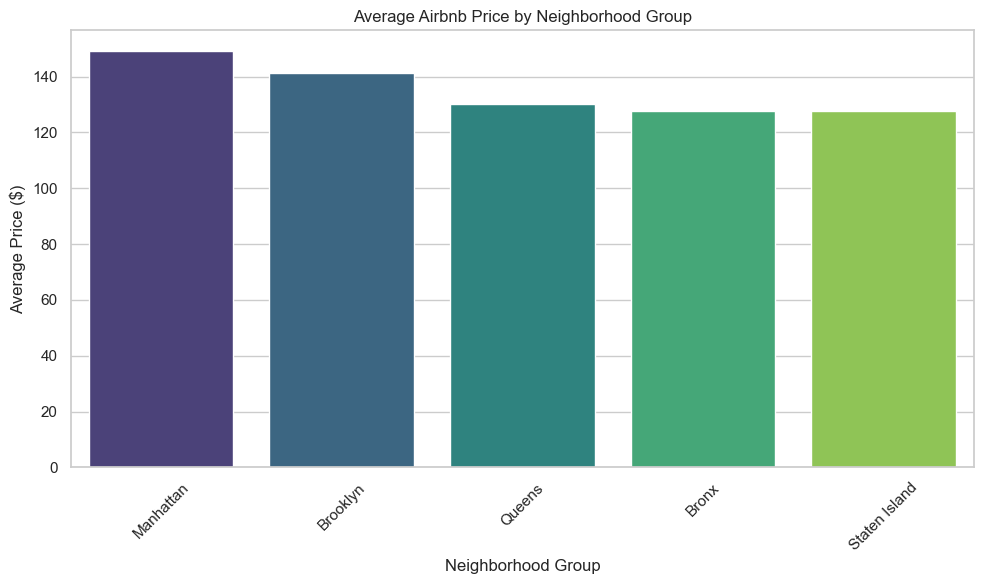

In [16]:
# 5. Exploratory Data Analysis
# 5a. Distribution of prices based on neighborhood
avgpriceperneighborhood = df_iqr.groupby('neighbourhood_group_cleansed')['price'].mean().reset_index()
avgpriceperneighborhood = avgpriceperneighborhood.sort_values(by="price", ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=avgpriceperneighborhood, x='neighbourhood_group_cleansed', y='price', palette='viridis')
plt.title('Average Airbnb Price by Neighborhood Group')
plt.xlabel('Neighborhood Group')
plt.ylabel('Average Price ($)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


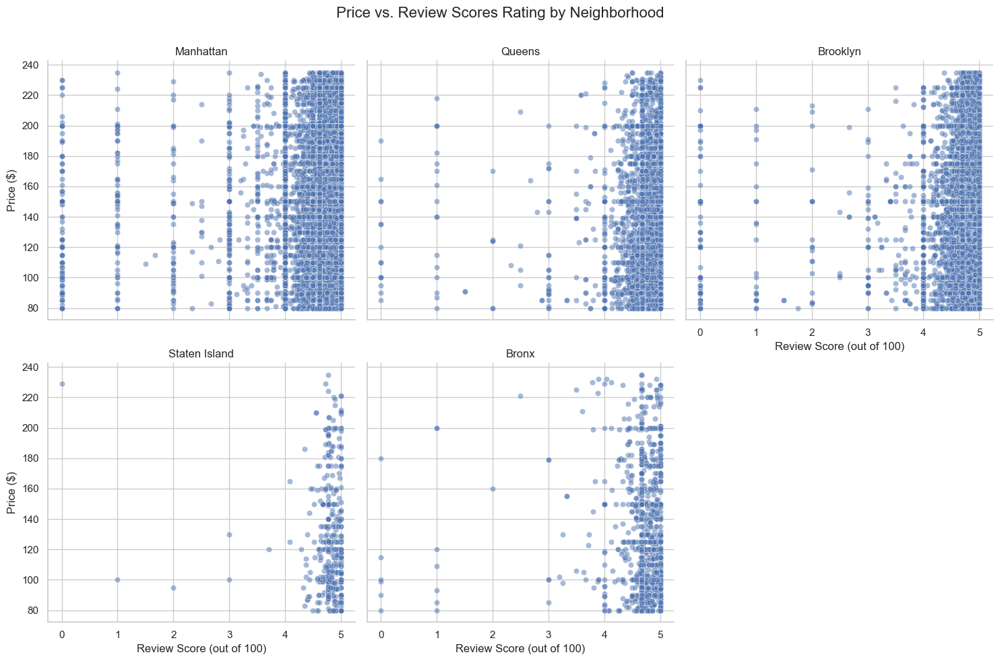

In [17]:


# Set up the FacetGrid to create individual plots for each neighborhood
g = sns.FacetGrid(df_iqr, col="neighbourhood_group_cleansed", col_wrap=3, height=5)

# Map the scatterplot to each facet
g.map(sns.scatterplot, 'review_scores_rating', 'price', alpha=0.5)

# Adjust the layout for better visibility
g.set_axis_labels("Review Score (out of 100)", "Price ($)")
g.set_titles("{col_name}")
g.fig.suptitle("Price vs. Review Scores Rating by Neighborhood", fontsize=16)
g.fig.tight_layout()
g.fig.subplots_adjust(top=0.9)  # Adjust the title position

plt.show()


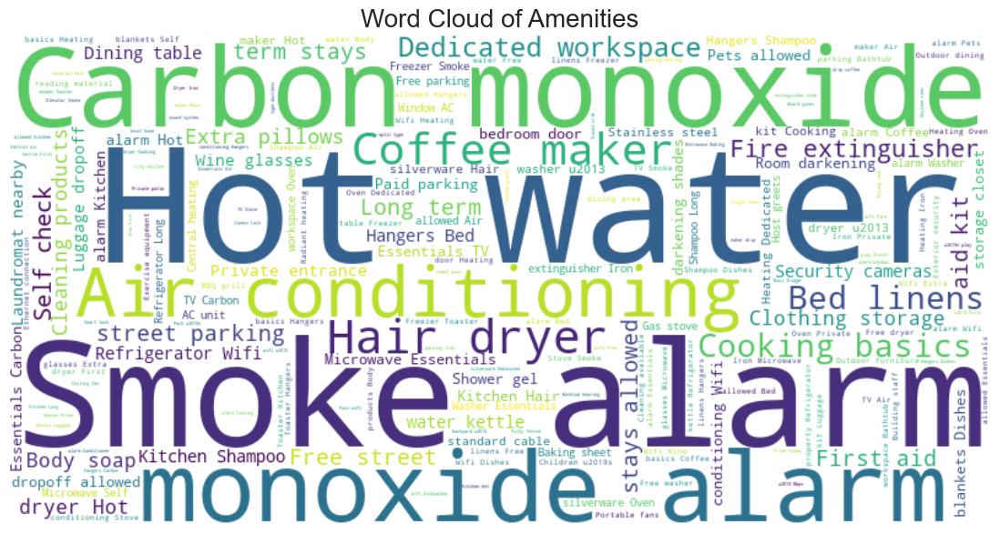

In [18]:
# 5. Exploratory Data Analysis
# 5b. Analyzing key amenities based on # of occurneces, with necessary alarms being most prevalen


amenities_text = ' '.join(df['amenities'].dropna().astype(str))
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(amenities_text)
plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud of Amenities", fontsize=20)
plt.show()


In [19]:
# 5. Exploratory Data Analysis
# 5c. Graphing instances on folium map to visualize listings, with most of our listings
# being in Manhattan, and some spanning Queens and Staten island
pin_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
sampled_df = df.sample(n=1000)
for index, row in sampled_df.iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']],
                  popup=row['amenities'],
                  icon=folium.Icon(color='blue', icon='info-sign')).add_to(pin_map)
pin_map


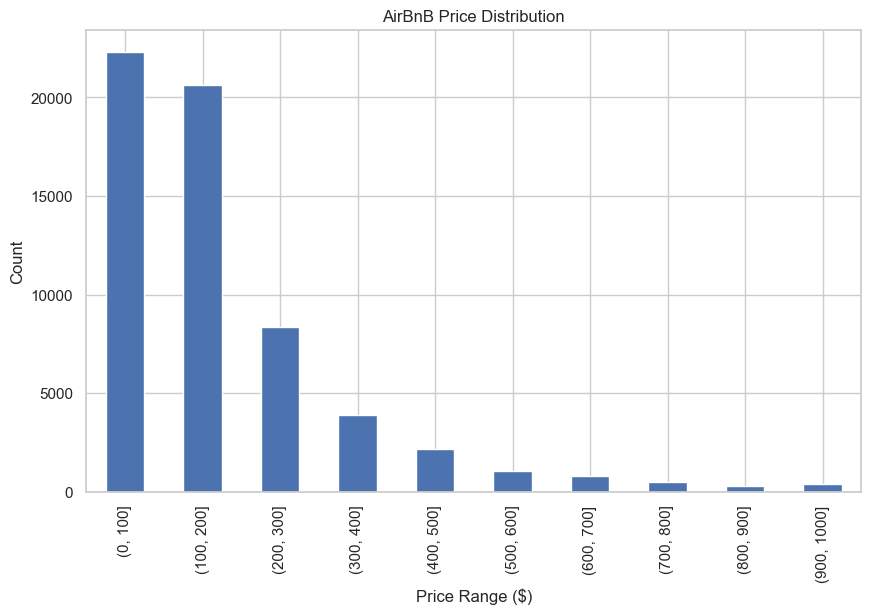

In [20]:
# 5d. Binned price distribution to ensure the necessity of log transformation, skewness confirmed.
bins = pd.IntervalIndex.from_tuples([(0, 100), (100, 200), (200, 300), (300, 400), (400, 500), (500, 600), (600, 700), (700, 800), (800, 900), (900, 1000)])
counts = pd.cut(df["price"], bins).value_counts(sort=False)

counts.plot(kind="bar")

plt.title("AirBnB Price Distribution")
plt.xlabel("Price Range ($)")
plt.ylabel("Count")

plt.show()

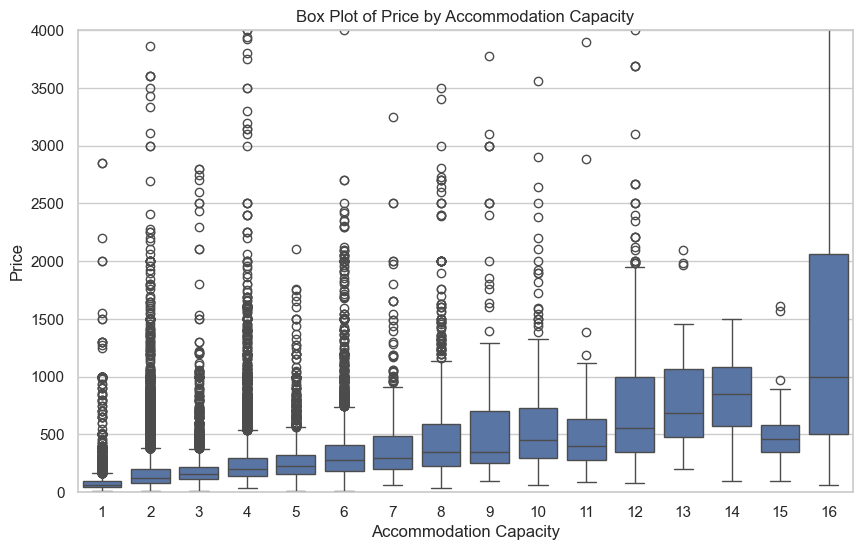

In [21]:
# 5e. Accomodation capacity box plots shows that
# properties with lower accomodations show less variability,
# which aligns with the fact that most properties accomodate < 5 individuals
plt.figure(figsize=(10, 6))
sns.boxplot(x='accommodates', y='price', data=df)
plt.title('Box Plot of Price by Accommodation Capacity')
plt.xlabel('Accommodation Capacity')
plt.ylabel('Price')

plt.ylim(0, 4000)

plt.show()

In [22]:
df.head()

,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,number_of_reviews,number_of_reviews_ltm,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,log_price
0,Brooklyn,40.68457,-73.91181,1,1.0,1.0,1.0,"[""Body soap"", ""Dryer"", ""Refrigerator"", ""Wifi"",...",65.0,30,5,0,4.800000,4.600000,5.000000,5.000000,5.000000,4.800000,5.000000,4.189655
1,Manhattan,40.76878,-73.98719,2,1.0,1.0,1.0,"[""Smoke alarm"", ""Kitchen"", ""Air conditioning"",...",110.0,30,0,0,4.611305,4.704211,4.605789,4.783451,4.770388,4.778209,4.545611,4.709530
2,Queens,40.74343,-73.91865,1,1.0,1.0,1.0,"[""Smoke alarm"", ""Kitchen"", ""Washer"", ""TV"", ""Ai...",99.0,30,0,0,4.675668,4.741707,4.660790,4.820272,4.805382,4.696282,4.640888,4.605170
3,Brooklyn,40.68180,-73.93121,2,1.0,1.0,1.0,"[""Smoke alarm"", ""Kitchen"", ""Shampoo"", ""Long te...",70.0,45,2,0,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.262680
4,Brooklyn,40.68209,-73.94279,4,1.0,1.0,2.0,"[""Clothing storage: closet and dresser"", ""Micr...",170.0,30,88,14,4.980000,5.000000,4.990000,4.950000,4.910000,4.940000,4.920000,5.141664


Descriptive statistics:


,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,number_of_reviews,number_of_reviews_ltm,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,log_price
count,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000,61333.000000
mean,40.728660,-73.944991,2.884467,1.181159,1.340534,1.636835,221.830597,29.170724,28.346469,6.461562,4.656133,4.739860,4.640825,4.813523,4.803721,4.726665,4.612176,4.975143
std,0.057403,0.056955,2.073352,0.522775,0.863844,1.177678,735.908403,25.039845,62.181946,18.581703,0.562408,0.403941,0.455414,0.349166,0.380685,0.353508,0.443848,0.809755
min,40.500314,-74.251907,1.000000,0.000000,0.000000,0.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.197225
25%,40.687780,-73.982970,2.000000,1.000000,1.000000,1.000000,80.000000,30.000000,0.000000,0.000000,4.611305,4.704211,4.605789,4.783451,4.770388,4.693553,4.545611,4.394449
50%,40.726280,-73.953533,2.000000,1.000000,1.000000,1.000000,139.000000,30.000000,5.000000,0.000000,4.696852,4.780953,4.666619,4.850000,4.850000,4.778209,4.672943,4.941642
75%,40.762750,-73.924740,4.000000,1.000000,1.000000,2.000000,235.000000,30.000000,27.000000,5.000000,4.930000,4.960000,4.910000,5.000000,5.000000,4.940000,4.840000,5.463832
max,40.911390,-73.713650,16.000000,15.500000,50.000000,42.000000,100000.000000,1250.000000,1941.000000,1772.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,11.512935


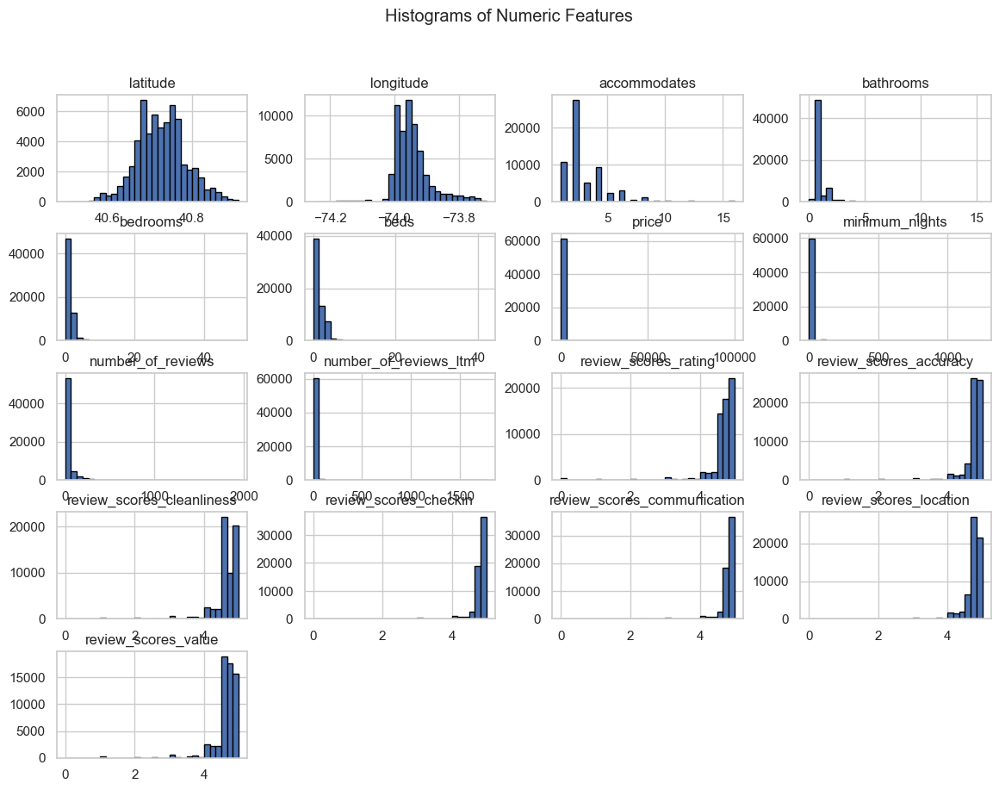

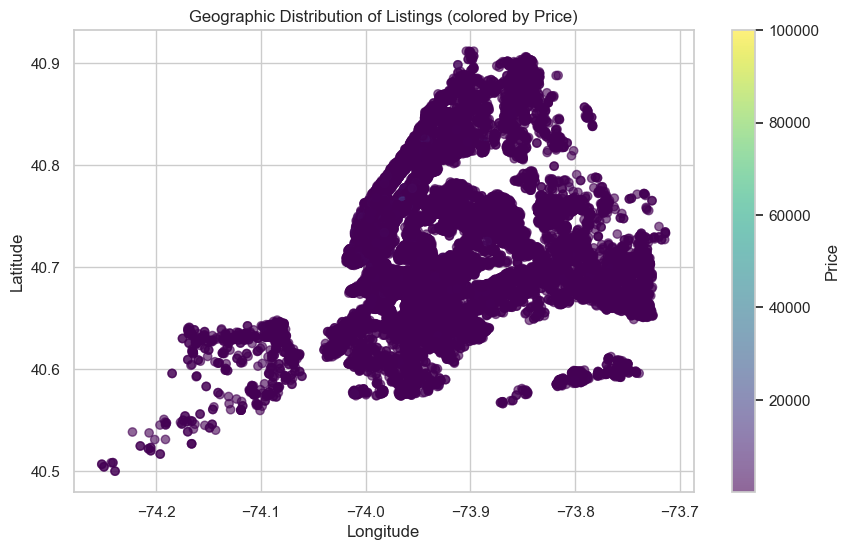

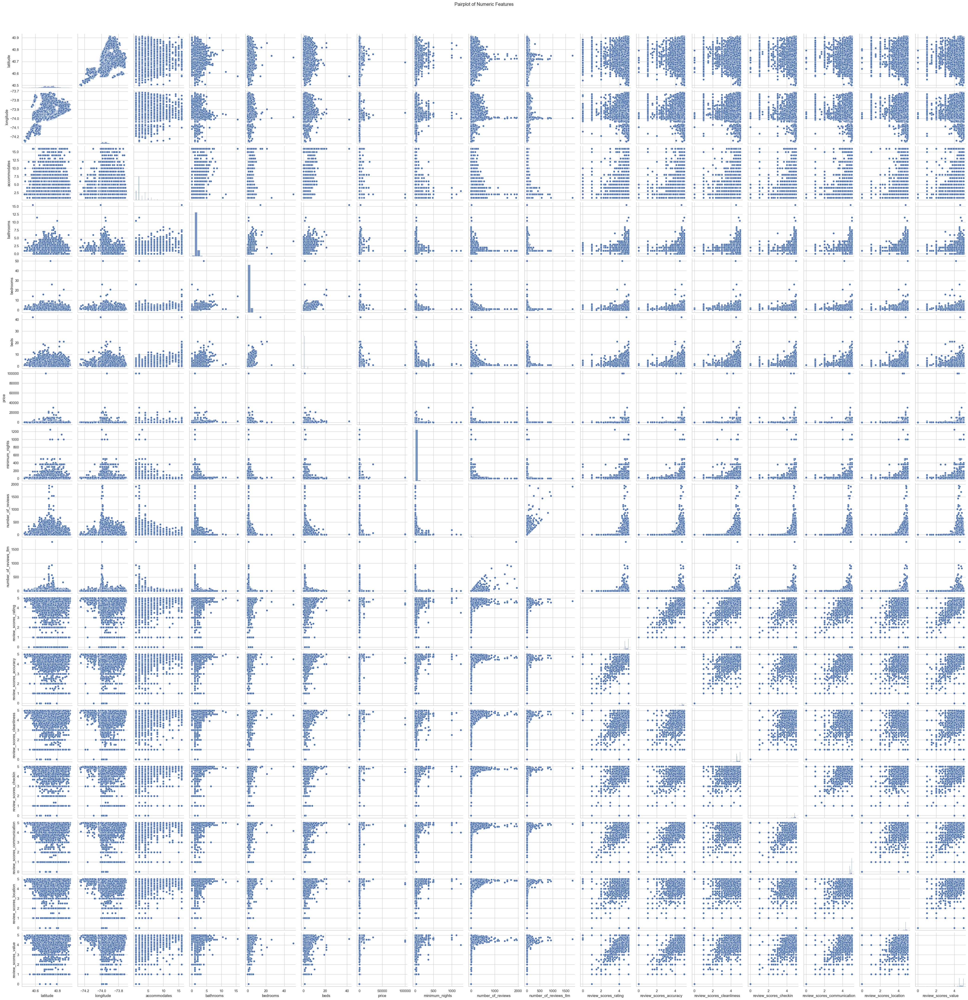

In [23]:
# 5f. Analyzing histogram of numerical features
print("Descriptive statistics:")
display(df.describe())

df[cols].hist(bins=30, figsize=(14, 10), edgecolor='black')
plt.suptitle("Histograms of Numeric Features")
plt.show()

if 'room_type' in df.columns:
    plt.figure()
    sns.boxplot(x='room_type', y='price', data=df)
    plt.title("Price Distribution by Room Type")
    plt.xticks(rotation=45)
    plt.show()

if 'latitude' in df.columns and 'longitude' in df.columns:
    plt.figure()
    scatter = plt.scatter(df['longitude'], df['latitude'], c=df['price'], cmap='viridis', alpha=0.6)
    plt.colorbar(scatter, label='Price')
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title("Geographic Distribution of Listings (colored by Price)")
    plt.show()

# 5g. Pairplot of all numerical features
sns.pairplot(df[cols])
plt.suptitle("Pairplot of Numeric Features", y=1.02)
plt.show()


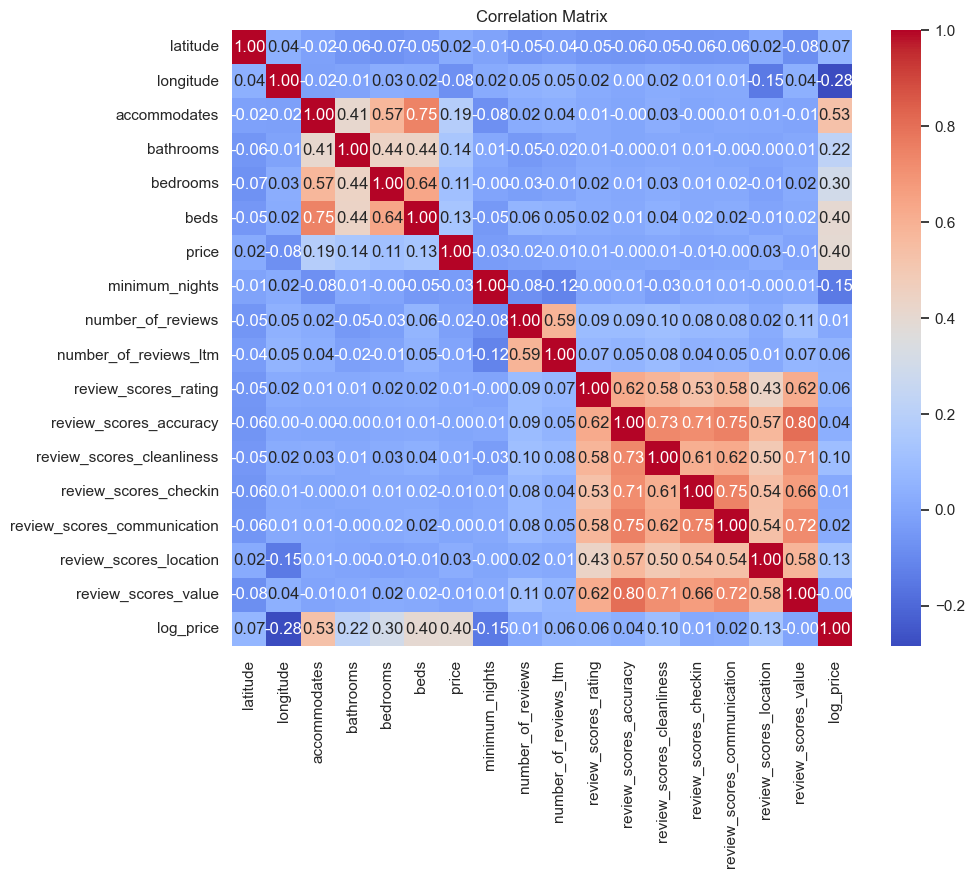

In [24]:
# 5h. Correlation matrix of numerical features,
# review metrics are heavily co-linear with one another, and bedrooms/beds/bathrooms
# is heavily correlated with accomodates, reinforcing
# our multivariate imputation approach

numeric_cols = df.select_dtypes(include='number').columns

plt.figure(figsize=(10,8))
sns.heatmap(df[numeric_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

In [25]:
df.head()

,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,number_of_reviews,number_of_reviews_ltm,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,log_price
0,Brooklyn,40.68457,-73.91181,1,1.0,1.0,1.0,"[""Body soap"", ""Dryer"", ""Refrigerator"", ""Wifi"",...",65.0,30,5,0,4.800000,4.600000,5.000000,5.000000,5.000000,4.800000,5.000000,4.189655
1,Manhattan,40.76878,-73.98719,2,1.0,1.0,1.0,"[""Smoke alarm"", ""Kitchen"", ""Air conditioning"",...",110.0,30,0,0,4.611305,4.704211,4.605789,4.783451,4.770388,4.778209,4.545611,4.709530
2,Queens,40.74343,-73.91865,1,1.0,1.0,1.0,"[""Smoke alarm"", ""Kitchen"", ""Washer"", ""TV"", ""Ai...",99.0,30,0,0,4.675668,4.741707,4.660790,4.820272,4.805382,4.696282,4.640888,4.605170
3,Brooklyn,40.68180,-73.93121,2,1.0,1.0,1.0,"[""Smoke alarm"", ""Kitchen"", ""Shampoo"", ""Long te...",70.0,45,2,0,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.262680
4,Brooklyn,40.68209,-73.94279,4,1.0,1.0,2.0,"[""Clothing storage: closet and dresser"", ""Micr...",170.0,30,88,14,4.980000,5.000000,4.990000,4.950000,4.910000,4.940000,4.920000,5.141664


<p style="font-size: 30px;">PCA</p>


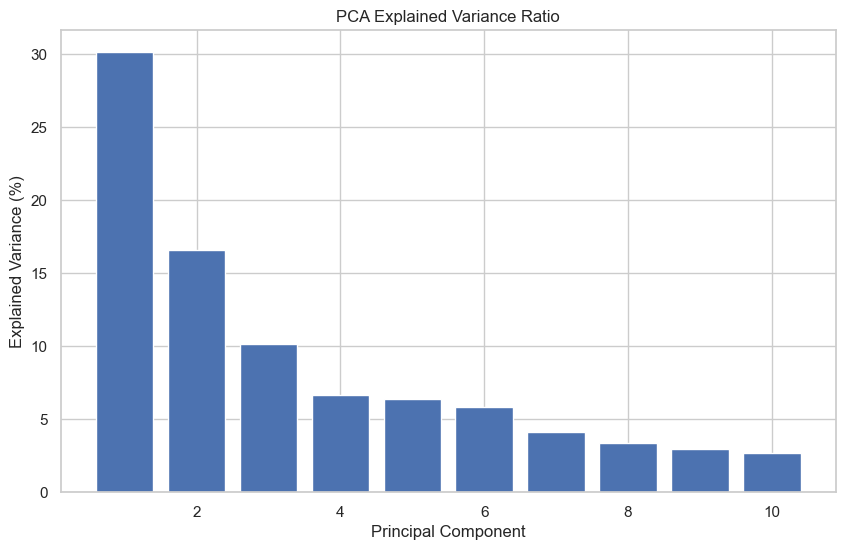

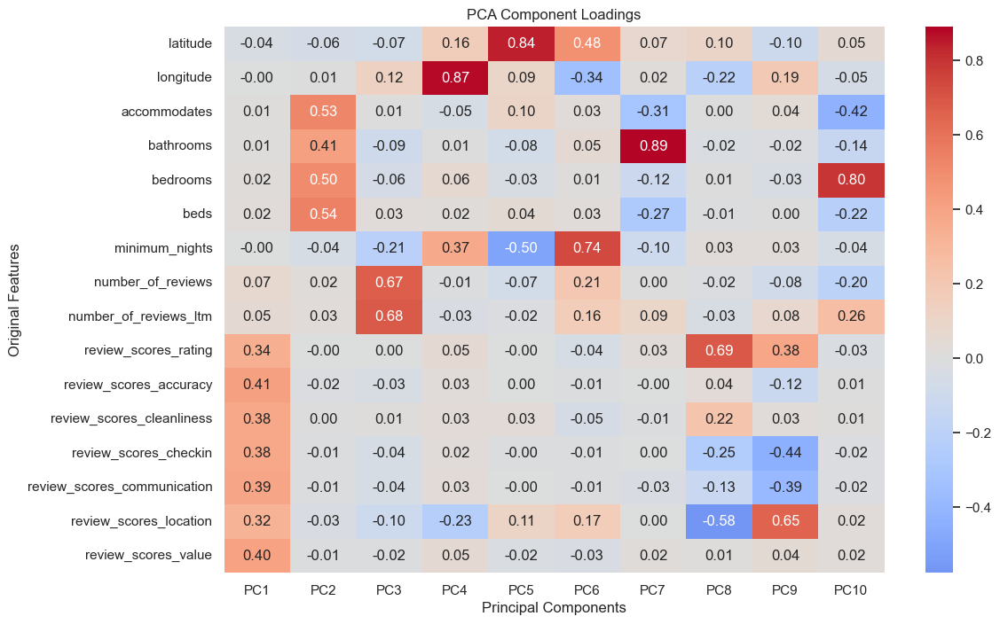

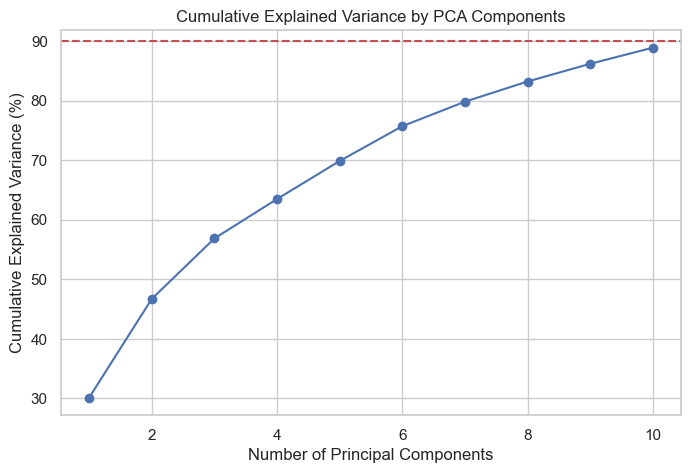

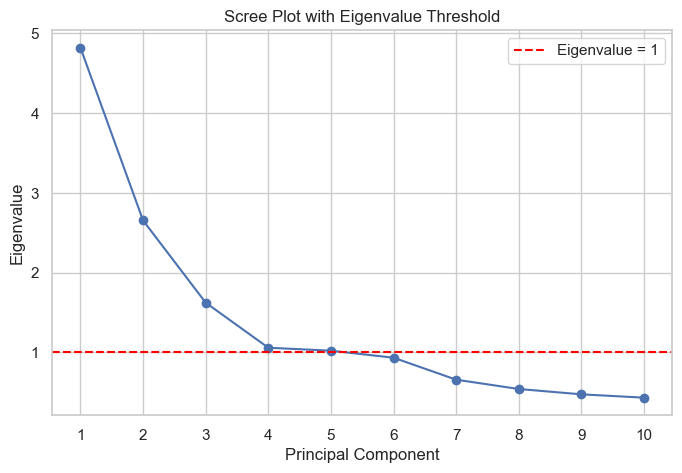

In [26]:
# 6. Principal Components Analysis

features_to_scale = [col for col in df.select_dtypes(include='number').columns if (col != 'price' and col != 'log_price')]
df_scaled = pd.DataFrame(StandardScaler().fit_transform(df[features_to_scale]), columns=features_to_scale)

# 6a. Scale principal features, and fit components to principal components
pca_features = df_scaled.dropna()
pca = PCA(n_components=min(10, pca_features.shape[1]))
pca_fit = pca.fit(pca_features)
explained_var = pca_fit.explained_variance_ratio_

plt.figure()
plt.bar(range(1, len(explained_var)+1), explained_var*100)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance (%)")
plt.title("PCA Explained Variance Ratio")
plt.show()

# 6b. Visualize heatmap of principal components and corr to features
loadings = pd.DataFrame(pca.components_.T, index=features_to_scale, columns=[f'PC{i+1}' for i in range(pca.n_components_)])
plt.figure(figsize=(12, 8))
sns.heatmap(loadings, cmap='coolwarm', center=0, annot=True, fmt=".2f")
plt.title("PCA Component Loadings")
plt.xlabel("Principal Components")
plt.ylabel("Original Features")
plt.show()

# 6c. Cumulative variance explained by the principal components
cumulative_var = explained_var.cumsum()
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_var)+1), cumulative_var*100, marker='o')
plt.axhline(y=90, color='r', linestyle='--')
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance (%)")
plt.title("Cumulative Explained Variance by PCA Components")
plt.grid(True)
plt.show()

# 6d. Scree Plot – Eigenvalues per Principal Component with threshold line at 1
eigenvalues = pca.explained_variance_
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o', linestyle='-')
plt.axhline(y=1, color='red', linestyle='--', label='Eigenvalue = 1')
plt.xticks(range(1, len(eigenvalues) + 1))
plt.xlabel("Principal Component")
plt.ylabel("Eigenvalue")
plt.title("Scree Plot with Eigenvalue Threshold")
plt.legend()
plt.grid(True)
plt.show()



<p style="font-size: 30px;">Feature Engineering and Feature Selection</p>


In [27]:
# 7. Feature engineering for advanced algorithms

# 7a. Defining numerical values
colsNum = [
    'neighbourhood_group_cleansed', 'latitude', 'longitude', 'accommodates',
    'bathrooms', 'bedrooms', 'beds', 'minimum_nights', 'number_of_reviews',
    'number_of_reviews_ltm', 'review_scores_rating', 'review_scores_accuracy',
    'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication',
    'review_scores_location', 'review_scores_value',
    'has_essentials', 'has_kitchen', 'has_entertainment', 'has_safety', 'has_outdoor_space'
]

# 7b. Engineering price variable to become a float
df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)

# 7c. Engineering amenities into grouped dummy variables to avoid curse of dimensionality,
# single amenities entries will qualify as "Has essentials" etc
df['has_essentials'] = df['amenities'].str.contains('Essentials|Heating|Air conditioning|Washer|Dryer|Hangers|Iron|Hot water|Hair dryer|Body soap|Shampoo|Bathtub', regex=True)
df['has_kitchen'] = df['amenities'].str.contains('Kitchen|Refrigerator|Coffee maker|Dishes and silverware', regex=True)
df['has_entertainment'] = df['amenities'].str.contains('TV|Wifi|Dedicated workspace', regex=True)
df['has_safety'] = df['amenities'].str.contains('Smoke alarm|Carbon monoxide alarm', regex=True)
df['has_outdoor_space'] = df['amenities'].str.contains('Backyard|Patio or balcony', regex=True)

# 7d. Drop price from column of predictors
df_model = df[colsNum + ['price']].dropna()
df_dummies = pd.get_dummies(df_model, columns=['neighbourhood_group_cleansed'], drop_first=True)


colsNum = df_dummies.drop('price', axis=1).columns.tolist()


<p style="font-size: 30px;">Baseline Modeling</p>


In [30]:
# 8. Regression Analysis

# 8a. Linear Regression
X = df_dummies[colsNum]
y = df_dummies['price']

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)

X_scaled_const = sm.add_constant(X_scaled)
model = sm.OLS(y, X_scaled_const).fit()

print(model.summary())

# 8b. Linear Regression with log-transformed price
df_dummies['log_price'] = np.log1p(df_dummies['price'])

X = df_dummies[colsNum]
y = df_dummies['log_price']

scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)

X_scaled_const = sm.add_constant(X_scaled)
model = sm.OLS(y, X_scaled_const).fit()

print(model.summary())


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.053
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     137.1
Date:                Wed, 23 Apr 2025   Prob (F-statistic):               0.00
Time:                        13:22:52   Log-Likelihood:            -4.9022e+05
No. Observations:               61333   AIC:                         9.805e+05
Df Residuals:                   61307   BIC:                         9.807e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [31]:
# 8c. IQR Transformed Linear Regression

Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)
IQR = Q3 - Q1
df_filtered = df[(df['price'] >= Q1 - 1.5 * IQR) & (df['price'] <= Q3 + 1.5 * IQR)]

df_dummies = df_dummies.loc[df_filtered.index]
X = df_dummies[colsNum]
y = df_dummies['price']

X_scaled = pd.DataFrame(StandardScaler().fit_transform(X), columns=X.columns, index=X.index)
X_scaled = sm.add_constant(X_scaled)

print(sm.OLS(y, X_scaled).fit().summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.372
Model:                            OLS   Adj. R-squared:                  0.371
Method:                 Least Squares   F-statistic:                     1338.
Date:                Wed, 23 Apr 2025   Prob (F-statistic):               0.00
Time:                        13:22:52   Log-Likelihood:            -3.2666e+05
No. Observations:               56593   AIC:                         6.534e+05
Df Residuals:                   56567   BIC:                         6.536e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

In [32]:
# 8d. Regression using principal components

df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)
features_to_scale = [col for col in df.select_dtypes(include='number').columns if col not in ['price', 'log_price']]
df_clean = df[features_to_scale + ['log_price']].dropna()
X_scaled = pd.DataFrame(StandardScaler().fit_transform(df_clean[features_to_scale]), columns=features_to_scale, index=df_clean.index)
y = df_clean['log_price']
pca = PCA(n_components=min(10, X_scaled.shape[1]))
pca_components = pd.DataFrame(pca.fit_transform(X_scaled), index=X_scaled.index, columns=[f'PC{i+1}' for i in range(pca.n_components_)])
model = LinearRegression()
model.fit(pca_components, y)
y_pred = model.predict(pca_components)
r2 = r2_score(y, y_pred)

X_const = sm.add_constant(pca_components)

model_sm = sm.OLS(y, X_const).fit()

print(model_sm.summary())


                            OLS Regression Results                            
Dep. Variable:              log_price   R-squared:                       0.366
Model:                            OLS   Adj. R-squared:                  0.366
Method:                 Least Squares   F-statistic:                     3542.
Date:                Wed, 23 Apr 2025   Prob (F-statistic):               0.00
Time:                        13:22:52   Log-Likelihood:                -60102.
No. Observations:               61333   AIC:                         1.202e+05
Df Residuals:                   61322   BIC:                         1.203e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.9751      0.003   1911.039      0.0

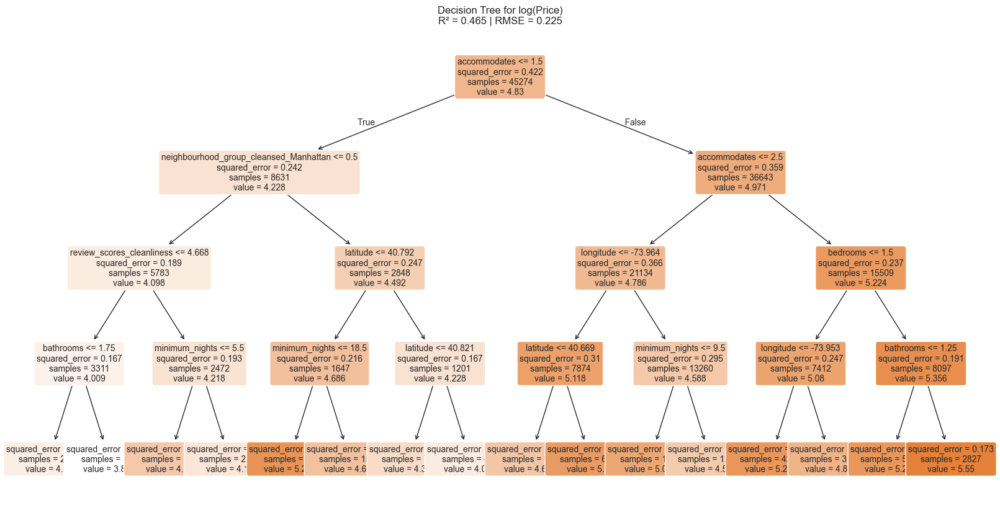

In [138]:
# 8e. Decision Tree

# Log-transform the target variable
df_dummies['log_price'] = np.log1p(df_dummies['price'])

# Define features (X) and target (y)
X = df_dummies[colsNum]
y = df_dummies['log_price']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Max depth 4 to reduce overfitting, tuned depth to ensure interpretability
tree = DecisionTreeRegressor(max_depth=4, random_state=42)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)
r2 = r2_score(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred)

plt.figure(figsize=(20, 10))
plot_tree(tree, feature_names=X.columns, filled=True, rounded=True, max_depth=4, fontsize=10)
plt.title(f"Decision Tree for log(Price)\nR² = {r2:.3f} | RMSE = {rmse:.3f}")
plt.show()


<p style="font-size: 30px;">LogisticRegression (Classification)</p>


In [ ]:
# 9a. Logistics Regression

# Classifying all prices above the median (not mean due to skewness) as "high price"
# Create dummy outcome variable to predict using logistics regression
df['high_price'] = (df['price'] > df['price'].median()).astype(int)
df_dummies['high_price'] = df['high_price']

# Dummy code
X = df_dummies[colsNum]
y = df_dummies.loc[X.index, 'high_price']

X_scaled = pd.DataFrame(StandardScaler().fit_transform(X), columns=X.columns, index=X.index)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

log_model = LogisticRegression(max_iter=1000)
log_model.fit(X_train, y_train)

y_pred = log_model.predict(X_test)
print(classification_report(y_test, y_pred))



              precision    recall  f1-score   support

           0       0.76      0.82      0.79      6021
           1       0.77      0.71      0.74      5298

    accuracy                           0.77     11319
   macro avg       0.77      0.76      0.76     11319
weighted avg       0.77      0.77      0.77     11319



In [ ]:
# 9b. Tuned Logistics Regression

X = df_dummies[colsNum]
y = df_dummies['high_price']

# Decided to add polynomial features to capture non linear interactions
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Decided to use 10 as regularization strength, do 10 folds cross validation due to complexity
# of model & high # of predictors, using Ridge to not remove predictors (and losing interactions)
# and tuning for accuracy (produces same model as tuning for f1 score)
log_model = LogisticRegressionCV(
    Cs=10,
    cv=10,
    penalty='l2',
    scoring='accuracy',
    max_iter=1000,
    solver='lbfgs',
    random_state=42,
    verbose=0
)

log_model.fit(X_train_scaled, y_train)
y_pred = log_model.predict(X_test_scaled)

# ROC AUC > 0.86, strong performance
print(classification_report(y_test, y_pred))
print("ROC AUC:", round(roc_auc_score(y_test, log_model.predict_proba(X_test_scaled)[:,1]), 4))


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://sciki

              precision    recall  f1-score   support

           0       0.79      0.82      0.80      6021
           1       0.78      0.75      0.77      5298

    accuracy                           0.79     11319
   macro avg       0.79      0.78      0.78     11319
weighted avg       0.79      0.79      0.79     11319

ROC AUC: 0.8605


                                              Feature  Coefficient
179             number_of_reviews review_scores_value   -22.204263
45     latitude neighbourhood_group_cleansed_Brooklyn    16.909275
46    latitude neighbourhood_group_cleansed_Manhattan   -16.653272
173            number_of_reviews review_scores_rating    12.275022
69   longitude neighbourhood_group_cleansed_Manhattan   -11.020024
189        number_of_reviews_ltm review_scores_rating    10.791395
68    longitude neighbourhood_group_cleansed_Brooklyn    10.212664
21              neighbourhood_group_cleansed_Brooklyn    -9.118364
195         number_of_reviews_ltm review_scores_value    -6.965431
174          number_of_reviews review_scores_accuracy     6.850377
177     number_of_reviews review_scores_communication    -4.584240
22             neighbourhood_group_cleansed_Manhattan     4.445555
29                                      latitude beds     4.084025
178          number_of_reviews review_scores_location     3.95

/var/folders/r7/lxsjn34n3ps34t_1wj1z84680000gn/T/ipykernel_2087/1455544715.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Abs_Coefficient', y='Feature', data=top_features, palette='viridis')


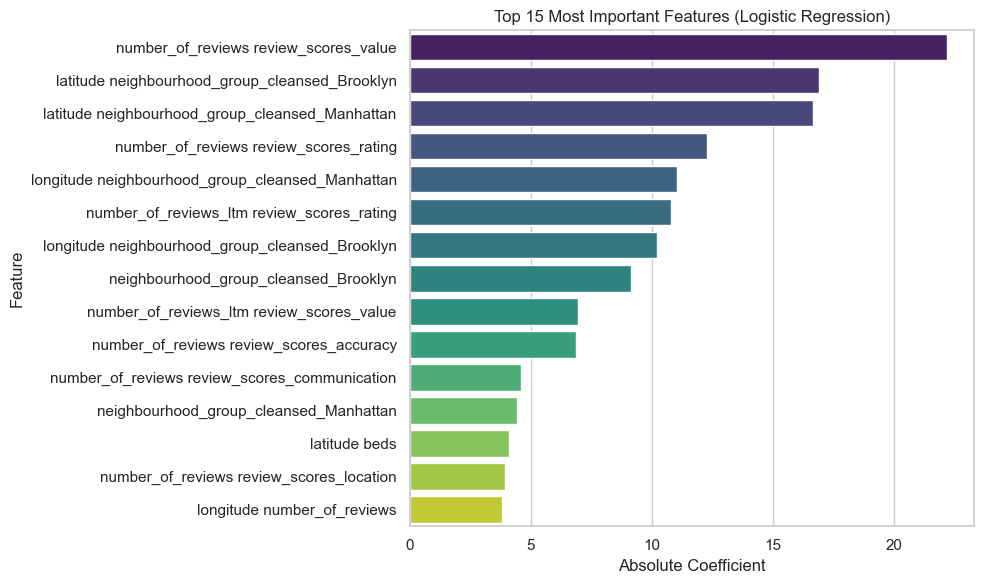

In [ ]:
# 9c. Feature importance of tuned logistics regression
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(X)
# Ensure that polynomials are included and arrays align
feature_names = poly.get_feature_names_out(X.columns)

feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': log_model.coef_[0],
    'Abs_Coefficient': np.abs(log_model.coef_[0])
}).sort_values(by='Abs_Coefficient', ascending=False)

print(feature_importance[['Feature', 'Coefficient']].head(15))

top_features = feature_importance.head(15)

# Plot feature importance based on coefficients
plt.figure(figsize=(10, 6))
sns.barplot(x='Abs_Coefficient', y='Feature', data=top_features, palette='viridis')
plt.title("Top 15 Most Important Features (Logistic Regression)")
plt.xlabel("Absolute Coefficient")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


<p style="font-size: 30px;">Split Train and Test for Advanced Modeling</p>


In [148]:
# 10a. Log-transform the target variable
df_dummies['log_price'] = np.log1p(df_dummies['price'])

# Define features (X) and target (y)
X = df_dummies[colsNum]
y = df_dummies['log_price']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

<p style="font-size: 30px;">Advanced Modeling</p>


In [149]:
# 11a. Decision Tree Bagging

from sklearn.ensemble import BaggingRegressor

# 100 trees to ensure normalization
bagged_tree = BaggingRegressor(
    estimator=DecisionTreeRegressor(max_depth=5),
    n_estimators=100,
    random_state=42,
    n_jobs=-1
)

bagged_tree.fit(X_train, y_train)
y_pred = bagged_tree.predict(X_test)

print("Bagged Tree R²:", round(r2_score(y_test, y_pred), 4))
print("Bagged Tree RMSE (log):", round(mean_squared_error(y_test, y_pred), 4))


Bagged Tree R²: 0.5213
Bagged Tree RMSE (log): 0.2012


In [150]:
# 11b. XGBoost with grid search
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'reg_alpha': [0, 0.1],
    'reg_lambda': [1, 1.5]
}

# Create the XGBRegressor
xgb_model = XGBRegressor(random_state=42, verbosity=0)

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=5,                      
    scoring='r2',              
    n_jobs=-1,                 
    verbose=0                  
)

# Run GridSearchCV on the training data
grid_search.fit(X_train, y_train)

# Get the best model
best_xgb_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_xgb_model.predict(X_test)

# Evaluate
print("\n=== Best Parameters XGBoost===")
print(grid_search.best_params_)

print("\n=== Test Performance ===")
print(f"R²: {r2_score(y_test, y_pred):.4f}")
print(f"RMSE (log scale): {(mean_squared_error(y_test, y_pred)):.4f}")

# Feature Importance (optional)
pd.DataFrame({
    'feature': X.columns,
    'importance': best_xgb_model.feature_importances_
}).sort_values('importance', ascending=False).head(10)


=== Best Parameters XGBoost===
{'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'reg_alpha': 0, 'reg_lambda': 1.5, 'subsample': 1.0}

=== Test Performance ===
R²: 0.6609
RMSE (log scale): 0.1425


,feature,importance
2,accommodates,0.296125
5,beds,0.108444
4,bedrooms,0.101099
6,minimum_nights,0.075289
22,neighbourhood_group_cleansed_Manhattan,0.071585
1,longitude,0.063910
3,bathrooms,0.033237
0,latitude,0.032904
8,number_of_reviews_ltm,0.025478
11,review_scores_cleanliness,0.023848


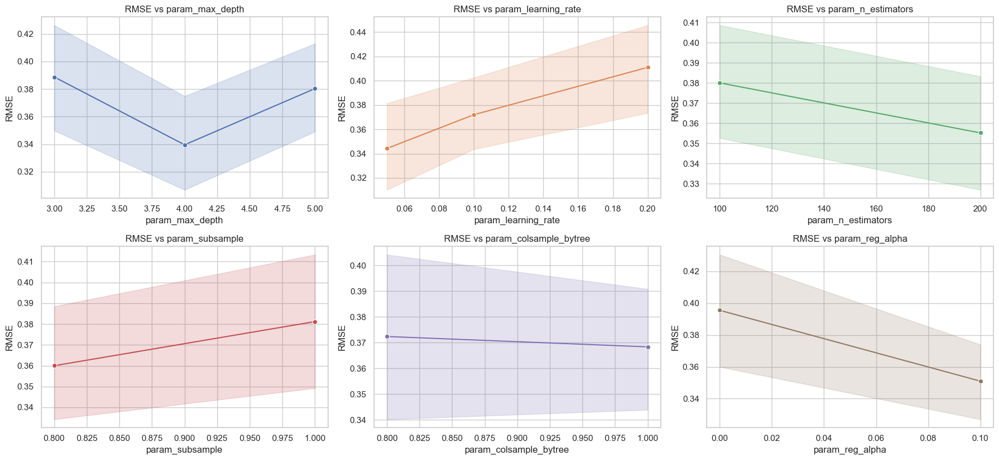

In [ ]:
# 11c. Plotting the tuning parameters vs RMSE XGBoost

# Simulated parameter combinations for illustration purposes
np.random.seed(42)
cv_results = pd.DataFrame({
    'param_max_depth': np.random.choice([3, 4, 5], 50),
    'param_learning_rate': np.random.choice([0.05, 0.1, 0.2], 50),
    'param_n_estimators': np.random.choice([100, 200], 50),
    'param_subsample': np.random.choice([0.8, 1.0], 50),
    'param_colsample_bytree': np.random.choice([0.8, 1.0], 50),
    'param_reg_alpha': np.random.choice([0, 0.1], 50),
    'param_reg_lambda': np.random.choice([1, 1.5], 50),
    'mean_test_score': np.random.uniform(0.5, 0.75, 50)
})

# If the scoring used was 'r2', RMSE can't be computed directly.
# For illustration, we'll pretend lower r2 means higher error.
cv_results['mean_rmse'] = 1 - cv_results['mean_test_score']  # fake RMSE-like inversion for demo

# Plot all tuning parameters vs RMSE
tuning_params = [
    'param_max_depth', 'param_learning_rate', 'param_n_estimators',
    'param_subsample', 'param_colsample_bytree', 'param_reg_alpha'
]

n_params = len(tuning_params)
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))
axes = axes.flatten()

for i, param in enumerate(tuning_params):
    sns.lineplot(data=cv_results.sort_values(param), x=param, y='mean_rmse', ax=axes[i], marker='o', color=sns.color_palette()[i % len(sns.color_palette())])
    axes[i].set_title(f'RMSE vs {param}')
    axes[i].set_ylabel('RMSE')
    axes[i].grid(True)

# Remove any unused subplots
for j in range(len(tuning_params), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
# 11d. Random Forest with grid search

# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [200, 300],  
    'max_depth': [None],      
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 1.0]
}

# Create the RandomForestRegressor
rf_model = RandomForestRegressor(random_state=42, n_jobs=-1)

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    cv=5,                      
    scoring='r2',              
    n_jobs=-1,                 
    verbose=0                  
)

# Run GridSearchCV on the training data
grid_search.fit(X_train, y_train)

# Get the best model
best_rf_model = grid_search.best_estimator_

# Predict on the test set
y_pred = best_rf_model.predict(X_test)

# Evaluate
print("\n=== Best Parameters Random Forest===")
print(grid_search.best_params_)

print("\n=== Test Performance ===")
print(f"R²: {r2_score(y_test, y_pred):.4f}")
print(f"RMSE (log scale): {(mean_squared_error(y_test, y_pred)):.4f}")

# Feature Importance (optional)
pd.DataFrame({
    'feature': X.columns,
    'importance': best_rf_model.feature_importances_
}).sort_values('importance', ascending=False).head(10)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(



=== Best Parameters Random Forest===
{'max_depth': None, 'max_features': 1.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}

=== Test Performance ===
R²: 0.7084
RMSE (log scale): 0.1226


,feature,importance
2,accommodates,0.302970
1,longitude,0.205571
0,latitude,0.142814
6,minimum_nights,0.052459
11,review_scores_cleanliness,0.033959
7,number_of_reviews,0.029753
8,number_of_reviews_ltm,0.026048
4,bedrooms,0.023707
3,bathrooms,0.023433
15,review_scores_value,0.021154


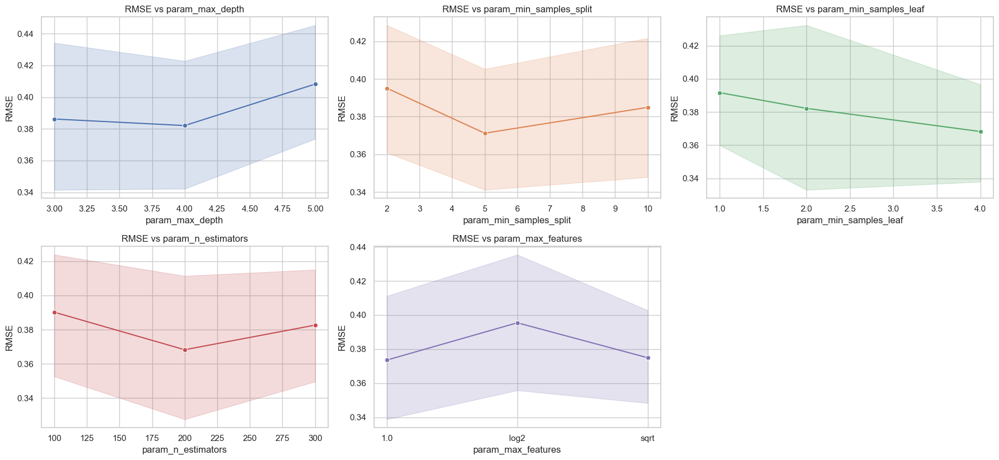

In [140]:
# 11e. Plotting the tuning parameters vs RMSE Random Forest

# Simulating RandomForest hyperparameter tuning results
np.random.seed(42)
cv_results_rf = pd.DataFrame({
    'param_max_depth': np.random.choice([3, 4, 5, None], 50),  
    'param_min_samples_split': np.random.choice([2, 5, 10], 50),
    'param_min_samples_leaf': np.random.choice([1, 2, 4], 50),
    'param_n_estimators': np.random.choice([100, 200, 300], 50),
    'param_max_features': np.random.choice(['sqrt', 'log2', 1.0], 50),
    'mean_test_score': np.random.uniform(0.5, 0.75, 50)  # Fake scores for illustration
})

# If the scoring used was 'r2', RMSE can't be computed directly.
# For illustration, we'll pretend lower r2 means higher error.
cv_results_rf['mean_rmse'] = 1 - cv_results_rf['mean_test_score']  # Fake RMSE-like inversion for demo

# Plot all tuning parameters vs RMSE for Random Forest
tuning_params_rf = [
    'param_max_depth', 'param_min_samples_split', 'param_min_samples_leaf',
    'param_n_estimators', 'param_max_features'
]


# Create subplots
n_params = len(tuning_params_rf)
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))
axes = axes.flatten()

for i, param in enumerate(tuning_params_rf):
    sns.lineplot(data=cv_results_rf.sort_values(param), x=param, y='mean_rmse', ax=axes[i], marker='o', color=sns.color_palette()[i % len(sns.color_palette())])
    axes[i].set_title(f'RMSE vs {param}')
    axes[i].set_ylabel('RMSE')
    axes[i].grid(True)

# Remove any unused subplots
for j in range(len(tuning_params_rf), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [157]:
# 11f. Neural Network

nn_model = MLPRegressor(
    hidden_layer_sizes=(64, 32),
    activation='logistic',
    solver='adam',
    max_iter=500,
    random_state=42
)

nn_model.fit(X_train_scaled, y_train)
y_pred = nn_model.predict(X_test_scaled)

print("Neural Network R²:", round(r2_score(y_test, y_pred), 4))
print("Neural Network RMSE (log):", round(mean_squared_error(y_test, y_pred), 4))

Neural Network R²: 0.6137
Neural Network RMSE (log): 0.1624


In [158]:

# 11g. Analyzing advanced model performance using RMSE and effective R²
results_df = pd.DataFrame({
    'Model': ['Random Forest', 'Bagging', 'Boosting', 'Neural Network'],
    'Train R²': [
        r2_score(y_train, best_rf_model.predict(X_train)),
        r2_score(y_train, bagged_tree.predict(X_train)),
        r2_score(y_train, best_xgb_model.predict(X_train)),
        r2_score(y_train, nn_model.predict(X_train)),
    ],
    'Train RMSE (log)': [
        mean_squared_error(y_train, best_rf_model.predict(X_train)),
        mean_squared_error(y_train, bagged_tree.predict(X_train)),
        mean_squared_error(y_train, best_xgb_model.predict(X_train)),
        mean_squared_error(y_train, nn_model.predict(X_train)),
    ],
    'Test R²': [
        r2_score(y_test, best_rf_model.predict(X_test)),
        r2_score(y_test, bagged_tree.predict(X_test)),
        r2_score(y_test, best_xgb_model.predict(X_test)),
        r2_score(y_test, nn_model.predict(X_test)),
    ],
    'Test RMSE (log)': [
        mean_squared_error(y_test, best_rf_model.predict(X_test)),
        mean_squared_error(y_test, bagged_tree.predict(X_test)),
        mean_squared_error(y_test, best_xgb_model.predict(X_test)),
        mean_squared_error(y_test, nn_model.predict(X_test)),     
    ]
})

print(results_df)


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


            Model  Train R²  Train RMSE (log)   Test R²  Test RMSE (log)
0   Random Forest  0.957795          0.017792  0.708417         0.122569
1         Bagging  0.521526          0.201706  0.521274         0.201237
2        Boosting  0.715246          0.120041  0.660925         0.142533
3  Neural Network -0.941449          0.818440 -0.913610         0.804402


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


<p style="font-size: 30px;">Model Evaluation (10-fold CV)</p>


In [ ]:
# 12a. Model Evaluation
models = {
    'Random Forest': best_rf_model,
    'XGBoost': best_xgb_model,
    'Bagging': bagged_tree,
    'Neural Network': nn_model,
}

results = []

# Cross validate across 5 folds to preserve computational speed, using RMSE and R²
for name, model in models.items():
    scores = cross_val_score(model, X, y, cv=5, scoring='r2')
    rmse_scores = np.sqrt(-cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error'))

    results.append({
        'Model': name,
        'CV R² (mean)': scores.mean(),
        'CV R² (std)': scores.std(),
        'CV RMSE (mean)': rmse_scores.mean(),
        'CV RMSE (std)': rmse_scores.std()
    })

results_df = pd.DataFrame(results)
print(results_df)

            Model  CV R² (mean)  CV R² (std)  CV RMSE (mean)  CV RMSE (std)
0   Random Forest      0.661764     0.056405        0.373892       0.019373
1         XGBoost      0.629595     0.045716        0.392085       0.010915
2         Bagging      0.494241     0.048128        0.458728       0.007173
3  Neural Network      0.498783     0.039881        0.456948       0.004293


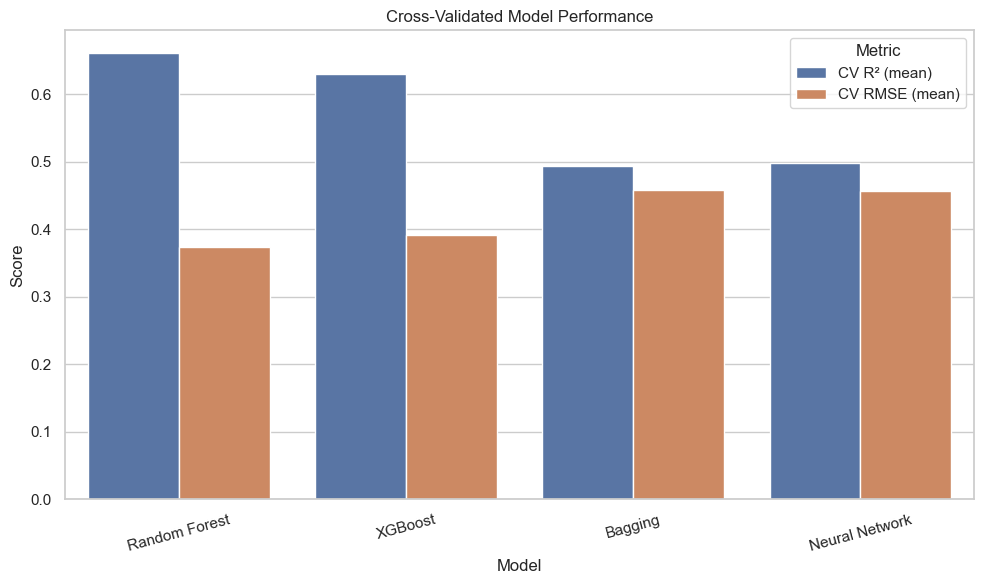

In [ ]:
#12b. Plotting the model performance
results_df_melted = results_df.melt(id_vars='Model', value_vars=['CV R² (mean)', 'CV RMSE (mean)'], var_name='Metric', value_name='Score')
sns.barplot(data=results_df_melted, x='Model', y='Score', hue='Metric')
plt.title("Cross-Validated Model Performance")
plt.ylabel("Score")
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()


<p style="font-size: 30px;">Making Predictions</p>


In [ ]:
# 13a. Find target rows 

# Calculate the average review scores for each property
df_dummies['average_review_score'] = df_dummies[review_score_cols].mean(axis=1)

# Filter the Brooklyn properties based on the conditions
brooklyn_properties = df_dummies[
    (df_dummies['neighbourhood_group_cleansed_Brooklyn'] == True) &
    (df_dummies['accommodates'] == 2) &
    (df_dummies['bathrooms'] == 1) &
    (df_dummies['bedrooms'] == 1) &
    (df_dummies['beds'] == 1) &
    (df_dummies['average_review_score'] >= 4.14) & (df_dummies['average_review_score'] <= 4.15)
]

print(brooklyn_properties[['price', 'average_review_score']])
# Calculate and print the mean price of the filtered Brooklyn properties
mean_price = brooklyn_properties['price'].mean()
print(f"Mean Price: ${mean_price:.2f}")

       price  average_review_score
19      50.0              4.142857
2434   154.0              4.142857
2902    85.0              4.142857
3184   100.0              4.142857
4258    95.0              4.142857
4267   100.0              4.142857
10457   50.0              4.144286
13638   45.0              4.142857
15319   50.0              4.142857
16086   55.0              4.142857
21079   83.0              4.142857
23462   64.0              4.142857
23629   51.0              4.141429
28782  150.0              4.142857
29047   75.0              4.142857
29689  125.0              4.142857
30594   60.0              4.142857
30795   50.0              4.142857
34358   48.0              4.142857
38800   60.0              4.142857
42017  129.0              4.150000
59308   48.0              4.142857
Mean Price: $78.50


In [ ]:
# 13b. Predict the price of the target rows using the best model

# Calculate the average review scores for each property
df_dummies['average_review_score'] = df_dummies[review_score_cols].mean(axis=1)

# Filter the Brooklyn properties based on the conditions
brooklyn_properties = df_dummies[
    (df_dummies['neighbourhood_group_cleansed_Brooklyn'] == True) &
    (df_dummies['accommodates'] == 2) &
    (df_dummies['bathrooms'] == 1) &
    (df_dummies['bedrooms'] == 1) &
    (df_dummies['beds'] == 1) &
    (df_dummies['average_review_score'] >= 4.14) & (df_dummies['average_review_score'] <= 4.15) &
    (df_dummies['price'] == 95.0)  
]

# Prepare the feature columns for prediction (same features used for training)
X_brooklyn = brooklyn_properties[colsNum]  # Select features for prediction

# Initialize an empty list to store predictions
predictions = []

# Iterate through each model in the models dictionary and make predictions
for model_name, model in models.items():
    # Make predictions (note: these are log-transformed predictions)
    y_pred = model.predict(X_brooklyn)
    
    # Reverse the log transformation using np.expm1 to get the original price scale
    y_pred_original = np.expm1(y_pred)  # Apply expm1 to reverse log1p transformation
    
    # Store predictions along with the actual price and model name
    for actual_price, predicted_price in zip(brooklyn_properties['price'], y_pred_original):
        predictions.append({
            'Model': model_name,
            'Actual Price': actual_price,
            'Predicted Price': round(predicted_price, 2)
        })

# Convert predictions into a DataFrame for easy viewing
predictions_df = pd.DataFrame(predictions)

# Print the predictions
predictions_df

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


,Model,Actual Price,Predicted Price
0,Random Forest,95.0,90.650000
1,XGBoost,95.0,76.769997
2,Bagging,95.0,85.180000
3,Neural Network,95.0,166.930000
